# Homework 1 submission
for course: Data Science lab 2   
at: Afeka College of engineering  
by:
- Michael Berger   
- Rashan Shkeer
 

Lecturer: Dr. Sharon Yalov-Handzel  



## 1. Choose a Python environment 
and install it on your computer (PyCharm or Google Colab).

## 2. Install the following libraries: 
numpy, matplotlib, pandas, tensorflow, sklearn, and pytorch.

In [1]:
import numpy as np
import pandas as pd
import sklearn 
import matplotlib.pyplot as plt
import tensorflow as tf
#import pytorch as pt

import os
from datetime import datetime
import statistics as stat

import plotly.express as px
from plotly.subplots import make_subplots

%matplotlib inline

2024-06-15 18:15:44.459196: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-06-15 18:15:44.498751: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-15 18:15:45.344379: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


## 3. Write a program that loads the MNIST dataset

In [2]:
# Check TensorFlow version
print("TensorFlow version:", tf.__version__)

# Load and prepare the MNIST dataset
mnist = tf.keras.datasets.mnist
(x_train, y_train), (x_test, y_test) = mnist.load_data()

TensorFlow version: 2.16.1


In [3]:
print ("x_train.shape", x_train.shape, 
       "\n", "x_test.shape", x_test.shape)

x_train.shape (60000, 28, 28) 
 x_test.shape (10000, 28, 28)


In [4]:
#
# Helper function to show a list of images with their relating titles
#
def show_images(images, title_texts):
    cols = 5
    rows = int(len(images)/cols) + 1
    plt.figure(figsize=(30,20))
    index = 1    
    for x in zip(images, title_texts):        
        image = x[0]        
        title_text = x[1]
        plt.subplot(rows, cols, index)        
        plt.imshow(image, cmap=plt.cm.gray)
        if (title_text != ''):
            plt.title(title_text, fontsize = 15);        
        index += 1

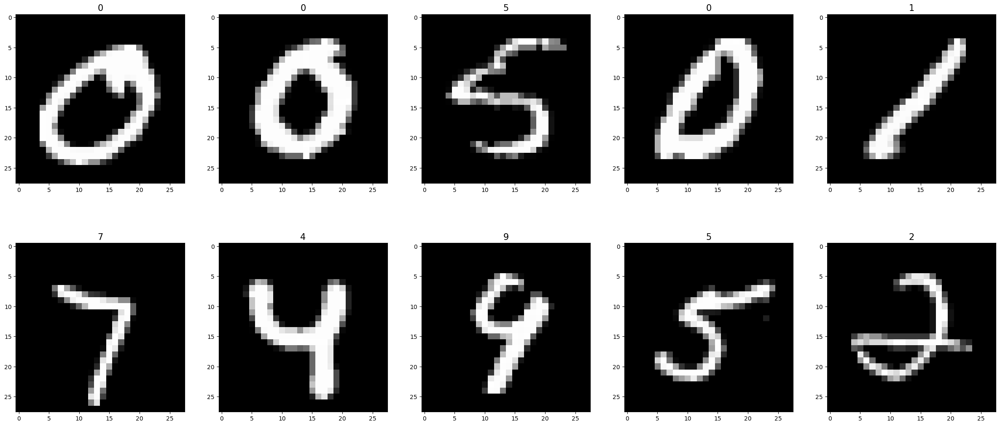

In [5]:
# 10 train examples
imgIds = stat.random.sample(range(len(y_train)), 10)
show_images(x_train[imgIds], y_train[imgIds] )

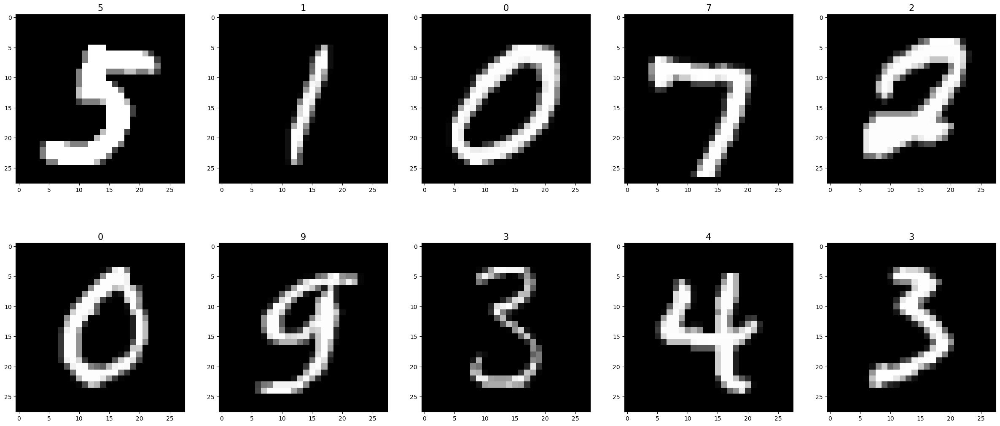

In [6]:
# 10 test examples
imgIds = stat.random.sample(range(len(y_test)), 10)
show_images(x_test[imgIds], y_test[imgIds] )

## 4. Present simple statistics of this dataset 
number of images, their distribution, 

In [7]:
px.histogram( y_train, barmode='group')

In [8]:
hst = np.histogram(y_train,);

In [9]:
np.mean( hst[0]), np.std( hst[0])

(6000.0, 322.082908581005)

In [10]:
img = x_train[3459]

In [11]:
y_train[3459]

4

In [12]:
px.imshow(img)

In [13]:
px.histogram(img.flatten())

### a. average number of white pixels in each class and its standard deviation, 

In [14]:
wat = np.apply_along_axis(np.count_nonzero, 1, x_train)
nonzeros_train = np.apply_along_axis(np.sum, 1, wat)
nonzeros_train = pd.DataFrame({"nonzeros": nonzeros_train, "y": y_train, "set":"train"})

In [15]:
wat = np.apply_along_axis(np.count_nonzero, 1, x_test)
nonzeros_test = np.apply_along_axis(np.sum, 1, wat)
nonzeros_test = pd.DataFrame({"nonzeros": nonzeros_test, "y": y_test, "set":"test"})

In [16]:
nonzeros = pd.concat([nonzeros_train, nonzeros_test])

The following plot summarizes distributions of nonzero pixels per class.

In [17]:
fig = px.box(nonzeros, y="nonzeros", x = "y", color="set", orientation="v")
fig.update_traces(boxmean=True)
fig

In [18]:
np.mean(nonzeros.nonzeros)/np.prod(x_test[0].shape)*100

19.1424471574344

On average, 19% of pixels in an image are non-zeros

### b. the number of common pixels in each class that are non-white.

First, let's split the datasets to their respective classes 

In [19]:
x_train_byclass = [x_train[y_train == l] for l in np.unique(y_train)]

In [20]:
len(x_train_byclass)

10

In [21]:
px.imshow(x_train_byclass[7][4000])

In [22]:
x_test_byclass = [x_test[y_test == l] for l in np.unique(y_test)]

Now, the x_..._byclass are lists containing   
axis 0 = classes of characters, 0,1, ... 9  
axis 1 = # of sample image  
axis 2 = rows  
axis 3 = cell of a row  

Let's take 67th sample of "0" class.  

Also, as we are only interested in non-white pixels, 
we can convert them into ones for convenient multiplications down the line.

In [23]:
zero = x_train_byclass[0][67]

In [24]:
px.imshow(1-(zero>0).astype(int))

Now,for each class we can:  
 apply pixel-wise multiplication over all the samples of a class

After that we acquire an aggreagated image of a class, 
which essentially shows the pixels that are always black, in every instance of the character.  
Unsurprisingly, these are on the borders.

In [25]:
nonwhites = [1-np.multiply.reduce(1-(clas>0).astype(int), axis=0) for clas in x_test_byclass]

In [26]:
nonwhites[0].shape

(28, 28)

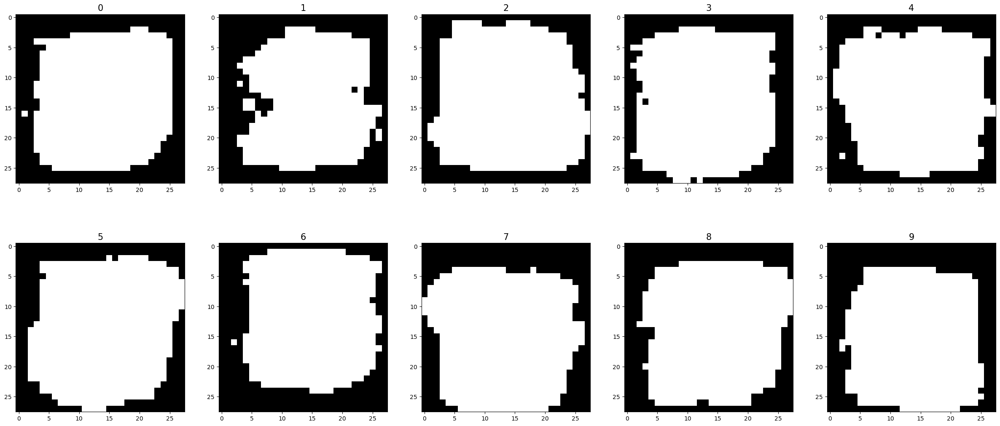

In [27]:
show_images(nonwhites, list(range(0,10)))

Another Interesting way to view an aggregation over classes is to look at "averaged" character:

In [28]:
averaged = [np.add.reduce(clas, axis=0) for clas in x_train_byclass]

In [29]:
averaged = [(clas * (255.0/clas.max())).astype(int) for clas in averaged]

In [30]:
averaged[0].shape

(28, 28)

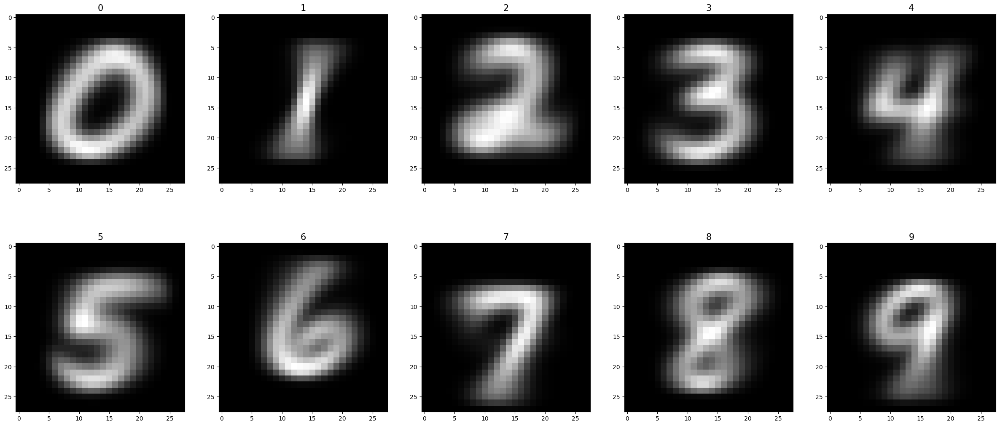

In [31]:
show_images(averaged, list(range(0,10)))

## 5. Apply a simple neural network to this dataset, in order to perform classification. 
(You can use the `tensorflowlib.py` program from Moodle). 
Describe the results of different measures: 
    accuracy, precision, recall, F1, sensitivity, and specificity

In [32]:
# Normalize pixel values to a range of 0 to 1
if x_train.max()>1:
    x_train, x_test = x_train / 255.0, x_test / 255.0
x_train.max()

1.0

In [33]:
# uncomment if you want to drop all the previous results
# and start measuring performance from start
fit_runs = pd.DataFrame(columns=['epoch','data'])
fit_runs

,epoch,data


In [34]:
epochs = 30

In [35]:
def apply_nn(x_train, y_train, x_test, y_test, epochs=5):
    # Construct the model
    model = tf.keras.models.Sequential([
        tf.keras.layers.Input(shape=x_train.shape[-2:]),
        # Flatten the 28x28 images to a 1D array
        tf.keras.layers.Flatten(),
        # Fully connected layer with 128 units and ReLU activation
        tf.keras.layers.Dense(128, activation='relu'),
        # Dropout layer to prevent overfitting
        tf.keras.layers.Dropout(0.2),
        # Output layer with 10 units (one for each digit class)
        tf.keras.layers.Dense(10)
    ])
    # metrics = ['precision', 'recall', 'f1-score', 'accuracy']
    model.compile(optimizer='adam',
                  loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                  metrics=['accuracy'])
    # Train the model
    print(f"training model with {epochs} epochs, please wait...")
    log = model.fit(x_train, y_train, epochs=epochs, validation_split= .1, verbose=0)

    # Evaluate the model on test set
    loss, acc = model.evaluate(x_test, y_test, verbose=0)
    log.history["tst_loss"]=loss
    log.history["tst_accuracy"] = acc
    print("done")
    return model, log
  

In [36]:
model, log = apply_nn(x_train, y_train, x_test, y_test, epochs=epochs)

2024-06-15 18:15:51.392862: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:282] failed call to cuInit: CUDA_ERROR_UNKNOWN: unknown error
2024-06-15 18:15:51.392880: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:134] retrieving CUDA diagnostic information for host: shawarma
2024-06-15 18:15:51.392882: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:141] hostname: shawarma
2024-06-15 18:15:51.392980: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:165] libcuda reported version is: 550.90.7
2024-06-15 18:15:51.392988: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:169] kernel reported version is: 550.90.7
2024-06-15 18:15:51.392990: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:248] kernel version seems to match DSO: 550.90.7


training model with 30 epochs, please wait...
done


In [37]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten (Flatten)               │ (None, 784)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       100,480 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 10)             │         1,290 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 305,312 (1.16 MB)

 Trainable params: 101,770 (397.54 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 203,542 (795.09 KB)

## 6. Describe the confusion matrix of the above classification. 
What conclusions can be drawn from this matrix?

The confusion matrix reveals how well the model performs across different classes.
Diagonal values indicate correct classifications, while off-diagonal values represent misclassifications.  
The classification report provides detailed performance metrics (precision, recall, F1-score) for each class.
High precision and recall values for a class indicate strong model performance for that class, while lower values suggest the need for further improvement.

In [38]:
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay
#cols = ['precision', 'recall', 'f1-score', 'support', 'accuracy', 'label','class']
confusion_runs = pd.DataFrame() #columns=cols)

In [39]:
def drop(df, col, val):
    # careful! 
    # use this  in case you made a mistake 
    # and submitted wrong data into report 
    # usage: drop_label("DimRed_pca")
    df = df.reset_index()
    i = df[df[col] == val].index
    return df.drop(i)
# example: 
#acc = drop(m, "metric", "loss")



def confuse(model, x_test, y_test, label):
    # Predict the labels of the test set
    y_pred = np.argmax(model.predict(x_test), axis=1)
    
    # Compute the confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    
    # Display the confusion matrix
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.arange(10))
    disp.plot(cmap=plt.cm.Blues)
    plt.show()
    
    # Print classification report
    rep = classification_report(y_test, y_pred,output_dict=True)

    global confusion_runs
    rep.pop("macro avg")
    rep.pop("weighted avg")#
    acc = rep.pop("accuracy")       
    df= pd.DataFrame.from_dict(rep).transpose()
    df["accuracy"] = acc
    df["label"] = label
    df["class"] = df.index

    if((confusion_runs.shape[0]>0) and (label in confusion_runs["label"].unique())):
        import warnings
        warnings.warn(f" label '{label}' already exists. replacing.")
        confusion_runs = drop(confusion_runs, "label", label) 
    
    confusion_runs = pd.concat([confusion_runs, df])
        
    melted = confusion_runs.melt(id_vars=[ 'label','class'], 
                        value_vars= ['precision', 'recall', 'f1-score',  'accuracy'],
                        var_name='metric', 
                        value_name='value')

    fig = px.bar(melted, x="class", y = "value", 
                 range_y= [melted.value.min()-0.01 ,1],
             color = "label", barmode="group", 
             facet_row = "metric", height=600)
    fig.show()
    return classification_report(y_test, y_pred)

313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 403us/step


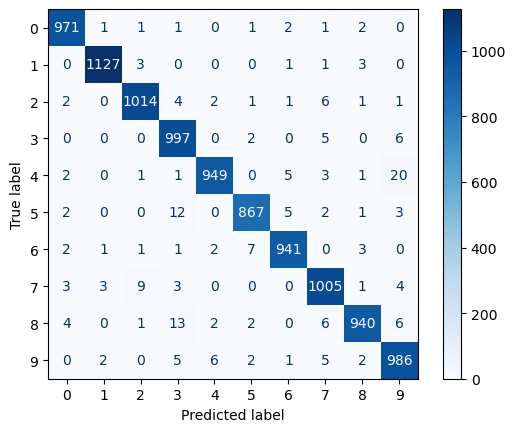

              precision    recall  f1-score   support

           0       0.98      0.99      0.99       980
           1       0.99      0.99      0.99      1135
           2       0.98      0.98      0.98      1032
           3       0.96      0.99      0.97      1010
           4       0.99      0.97      0.98       982
           5       0.98      0.97      0.98       892
           6       0.98      0.98      0.98       958
           7       0.97      0.98      0.97      1028
           8       0.99      0.97      0.98       974
           9       0.96      0.98      0.97      1009

    accuracy                           0.98     10000
   macro avg       0.98      0.98      0.98     10000
weighted avg       0.98      0.98      0.98     10000



In [40]:
f = confuse(model,x_test, y_test, "original")
print(f)

The confusion matrix shows us that even with a simple neural network and and low amount of epochs, th MNIST dataset can be correctly classified with above 96% on all important metrics.  
The second graph demonstrates distribution of important metrics per class.  
Can we improve further? 

## 7. Show a figure of the Loss along the training. 
What is the optimal number of epochs?

In [41]:
#fit_runs = pd.DataFrame(columns=['epoch','data'])


def report(fit_log, label):
    a = fit_log.history
    a["epoch"] = fit_log.epoch
    a["data"] = label
    log_df = pd.DataFrame(a)    
    global fit_runs # I know it's bad practice

    if((fit_runs.shape[0]>0) and  label in fit_runs.data.unique()):
        import warnings
        warnings.warn(f"data label '{label}' already exists. replacing.")
        drop(fit_runs, 'data', label)
    
    fit_runs = pd.concat([fit_runs, log_df])

    metrics = list(fit_log.history.keys())
    metrics.sort()
    
    log_df_melted = fit_runs.melt(id_vars=['epoch','data'], 
                            value_vars= metrics, #['accuracy', 'loss'], 
                            var_name='metric', 
                            value_name='value')
    
    rx = r"(?P<set>[valts]+_)?(?P<metric>[A-Za-z]+)"
    nspl = log_df_melted.metric.str.extract(rx)
    log_df_melted.drop('metric',axis=1, inplace=True)
    log_df_melted = log_df_melted.join(nspl)    
    log_df_melted.loc[log_df_melted.set.isna(),"set"] = "trn"
    log_df_melted.loc[log_df_melted.set == "val_", "set"] = "val"
    log_df_melted.loc[log_df_melted.set == "tst_", "set"] = "tst"

    fig = px.line(log_df_melted, x='epoch', y='value', title= "use mouse to zoom",
                  color='set', facet_row='metric', height=600,
                  facet_col="data", category_orders={"set": ["trn","val","tst"]}
                 )

    #fig.update_yaxes(matches='facet_row')
    return fig, log_df_melted


In [42]:
fig, melted = report(log, 'original')
#report(log, 'proc')

In [43]:
fig

Above graph demonstrates that optimal epoch is the one where training loss intersects validation loss, in this case it's epoch 6.  
Further manipulations on data require more epochs to converge, but no more than 30, hence I will limit it to 30. 


## 8. Construct a new dataset by:
### a. Bluring 
generate a new image for each image in the original dataset, where the value of each pixel is replaced by the average of all the surrounding pixels. 

In [44]:
def compare_images(images):
    # simple helper function to show 2 images side by side
    fig = make_subplots(rows=1, cols=2)
    for n, image in enumerate(images):
      fig.add_trace(px.imshow(image).data[0], col=n+1, row = 1)# , row=int(n/5)+11)
    return fig

In [45]:
def conv2d(a, f):
    # 2d convolution 
    npad = ((1, 1), (1, 1))
    a = np.pad(a, pad_width=npad, mode='constant', constant_values=0) 
    # probably also need to account for mask shape
    s = f.shape + tuple(np.subtract(a.shape, f.shape) + 1)
    strd = np.lib.stride_tricks.as_strided
    subM = strd(a, shape = s, strides = a.strides * 2)
    return np.einsum('ij,ijkl->kl', f, subM)

In [46]:
mask = np.ones([3,3])/8
mask[1,1] = 0
mask

array([[0.125, 0.125, 0.125],
       [0.125, 0.   , 0.125],
       [0.125, 0.125, 0.125]])

In [47]:
img_convd = conv2d(img,mask)

Validate with 1 image that we achieve expected result:

In [48]:
compare_images([img, img_convd])

In [49]:
x_train_blur = np.array([conv2d(img,mask) for img in x_train])
x_test_blur = np.array([conv2d(img,mask) for img in x_test])

# Normalize pixel values to a range of 0 to 1 if not yet
if x_train.max()>1:
    x_train, x_test = x_train / 255.0, x_test / 255.0
x_train.max()

1.0

Validate that we din't mix up something during mass conversion:

In [50]:
imgId = np.random.randint(len(x_train))
compare_images([x_train[imgId], x_train_blur[imgId]])

### b. Repeat steps 5-7 for this dataset.

In [51]:
# Train the model
model_blur, log = apply_nn(x_train_blur, y_train, x_test_blur,y_test, epochs=epochs)

training model with 30 epochs, please wait...
done


313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 425us/step


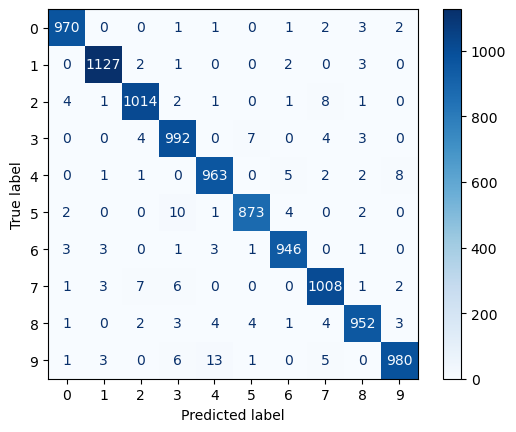

              precision    recall  f1-score   support

           0       0.99      0.99      0.99       980
           1       0.99      0.99      0.99      1135
           2       0.98      0.98      0.98      1032
           3       0.97      0.98      0.98      1010
           4       0.98      0.98      0.98       982
           5       0.99      0.98      0.98       892
           6       0.99      0.99      0.99       958
           7       0.98      0.98      0.98      1028
           8       0.98      0.98      0.98       974
           9       0.98      0.97      0.98      1009

    accuracy                           0.98     10000
   macro avg       0.98      0.98      0.98     10000
weighted avg       0.98      0.98      0.98     10000



In [52]:
rep = confuse(model_blur,x_test_blur, y_test, "blur")
print(rep)

The above graph shows that bluring operation helped increase the performance of NN over almost all the classes and metrics.

In [53]:
fig, melted = report(log, 'blur')
fig

## 9. Discuss the comparison 
Between the results of the classification applied to the original dataset and the modified dataset.

Comparing the test accuracy of the model trained on the original dataset with the accuracy on the modified dataset reveals how preprocessing affects performance.
If the accuracy significantly drops, it indicates the modification may have removed important features from the images.

This time, the training required a bit more epochs to converge, but produced better performance

## 10. Generate two new datasets with reduced dimensions:

### a. PCA (Principal Component Analysis).

In [54]:
from sklearn.decomposition import PCA

# Flatten the images for PCA
x_train_flat = x_train.reshape(len(x_train), -1)
x_test_flat = x_test.reshape(len(x_test), -1)

# Apply PCA
pca = PCA(n_components=100)
x_train_pca = pca.fit_transform(x_train_flat)
x_test_pca = pca.transform(x_test_flat)

# Reshape back to 2D
x_train_pca = x_train_pca.reshape(-1, 10, 10)
x_test_pca = x_test_pca.reshape(-1, 10, 10)

In [55]:
x_train_pca.shape

(60000, 10, 10)

In [56]:
x_train_flat.shape

(60000, 784)

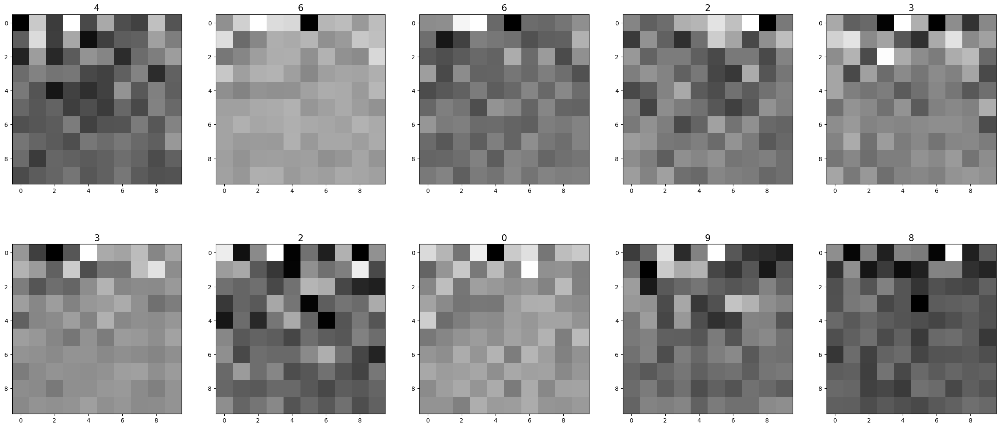

In [57]:
imgIds = stat.random.sample(range(len(y_train)), 10)
show_images(x_train_pca[imgIds], y_train[imgIds] )

### b. Downsampling
Replacing each non-overlapping 3x3 pixel block with its average value.

3x3 Pixel Block Averaging:

In [58]:
def downsample_by_averaging(img: np.ndarray, window_shape = (3,3)) -> np.ndarray:
    """
    First reshape your M x N image into a (M//3) x 3 x (N//3) x 3 array, 
    then use np.mean in the second and last dimensions.
    """
    return np.mean(
        img.reshape((
            *img.shape[:-2],
            img.shape[-2] // window_shape[-2], window_shape[-2],
            img.shape[-1] // window_shape[-1], window_shape[-1],
        )),
        axis=(-1, -3),
    )


In [59]:
# padding 28x28 image with zeros, so that resulting image shape 30x30 is divisible by 3x3
npad = ((0, 0), (1, 1), (1, 1))
x_train_padded = np.pad(x_train, pad_width=npad, mode='constant', constant_values=0)    
x_train_avg_block = downsample_by_averaging(x_train_padded)

x_test_padded = np.pad(x_test, pad_width=npad, mode='constant', constant_values=0)    
x_test_avg_block = downsample_by_averaging(x_test_padded)

# Normalize pixel values to a range of 0 to 1
#x_train_avg_block, x_test_avg_block = x_train_avg_block / 255.0, x_test_avg_block / 255.0

In [60]:
x_train_avg_block.shape

(60000, 10, 10)

In [61]:
imgId = 4993
compare_images([x_train[imgId], x_train_avg_block[imgId]])

## 11. Apply steps 5-7 to each of these new datasets.

### a. PCA 

In [62]:
# Train the model
model_pca, log = apply_nn(x_train_pca, y_train, x_test_pca,y_test, epochs=epochs)

training model with 30 epochs, please wait...
done


313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 340us/step


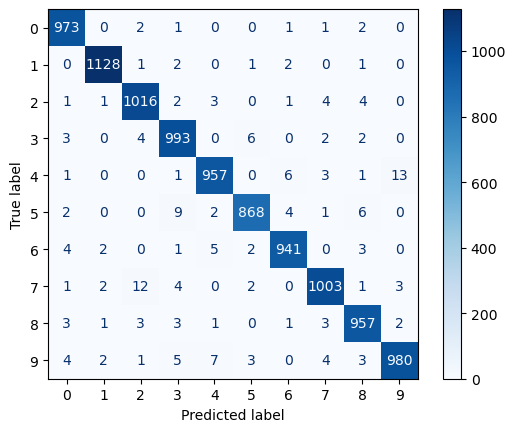

              precision    recall  f1-score   support

           0       0.98      0.99      0.99       980
           1       0.99      0.99      0.99      1135
           2       0.98      0.98      0.98      1032
           3       0.97      0.98      0.98      1010
           4       0.98      0.97      0.98       982
           5       0.98      0.97      0.98       892
           6       0.98      0.98      0.98       958
           7       0.98      0.98      0.98      1028
           8       0.98      0.98      0.98       974
           9       0.98      0.97      0.98      1009

    accuracy                           0.98     10000
   macro avg       0.98      0.98      0.98     10000
weighted avg       0.98      0.98      0.98     10000



In [63]:
rep = confuse(model_pca,x_test_pca, y_test, 'DimRed_pca')
print(rep)

In [64]:
fig, melted = report(log, 'DimRed_pca')
fig

PCA produced slightly better results than original data, 
but did not gain improvement over bluring.  
I would attribute that to non-locality of PCA. 
While bluring preserves the locations of pixels,  
PCA rearranges them "randomly" from the point 
of view of an image processing algorithm.

### b. Downsampling
Replacing each non-overlapping 3x3 pixel block with its average value.

In [65]:
# Train the model
model_avg_block, log = apply_nn(x_train_avg_block, y_train, x_test_avg_block,y_test, epochs=epochs)

training model with 30 epochs, please wait...
done


313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 535us/step


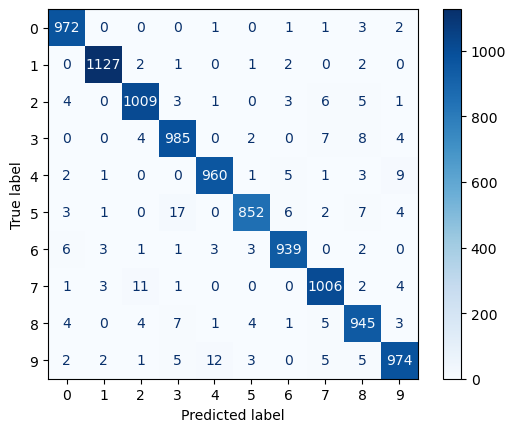

              precision    recall  f1-score   support

           0       0.98      0.99      0.98       980
           1       0.99      0.99      0.99      1135
           2       0.98      0.98      0.98      1032
           3       0.97      0.98      0.97      1010
           4       0.98      0.98      0.98       982
           5       0.98      0.96      0.97       892
           6       0.98      0.98      0.98       958
           7       0.97      0.98      0.98      1028
           8       0.96      0.97      0.97       974
           9       0.97      0.97      0.97      1009

    accuracy                           0.98     10000
   macro avg       0.98      0.98      0.98     10000
weighted avg       0.98      0.98      0.98     10000



In [66]:
rep = confuse(model_avg_block,x_test_avg_block, y_test, 'DimRed_avg')
print(rep)

Further degradation in performance is seen with downsampling.  
Nothhing surprising here, as downsampling means we remove more 
nuanced information from data.

In [67]:
fig, melted = report(log, 'DimRed_avg')
fig

## 12. Compare the results of the classification  
Applied to each of the reduced datasets and the original dataset.

Comparison Summary:


Original Dataset: Provides the baseline performance of the model.
Modified Dataset: If accuracy decreases, it suggests that averaging surrounding pixels may obscure critical features necessary for accurate classification.
PCA-reduced Dataset: A significant drop in accuracy may indicate that reducing dimensions via PCA might lose essential details, although it also helps to identify whether the dataset had redundant information.
3x3 Pixel Block Averaged Dataset: Similar to the modified dataset, block averaging simplifies the data and can show how well the model can generalize with reduced complexity.

## 13. Generate two new imbalanced datasets derived from the original dataset:

### a. Decimate
Perform undersampling for two classes within the existing 10 classes.

The classes to be decimated are: `3`,`4`

In [68]:
def decimate(X, y, val_to_dec = [3,4], decimation = 0.95):
    imgIds = np.where(np.isin(y, val_to_dec))[0]
    imgIds = np.random.choice(imgIds, size= int(len(imgIds)*decimation), replace=False)
    X_decim = np.delete(X,imgIds, axis = 0)
    y_decim = np.delete(y,imgIds)
    return X_decim, y_decim

In [69]:
X_train_decim, y_train_decim = decimate(x_train,y_train)
X_train_decim.shape, y_train_decim.shape

((48626, 28, 28), (48626,))

In [70]:
px.histogram(y_train_decim)

### b. Inflate 
Choose two classes among the existing 10 and increase the number of images belonging to these classes by performing image manipulations like rotation, flipping, blurring, etc.

In [71]:
#! conda install -y scikit-image

In [72]:

#from skimage import io 
from skimage.transform import rotate, AffineTransform, warp
from skimage import img_as_ubyte
from skimage.util import random_noise

In [73]:
# Shamelessly stolen from here: 
# https://github.com/govinda007/Images/blob/master/augmentation.ipynb

#Lets define functions for each operation
def rotation(image):
    angle= np.random.randint(-180,180)
    return rotate(image, angle)

def h_flip(image):
    return  np.fliplr(image)

def v_flip(image):
    return np.flipud(image)

def add_noise(image):
    return random_noise(image)

mask = np.ones([3,3])/8
mask[1,1] = 0

def blur_image(image):
    global mask    
    return conv2d(image,mask)

#I would not recommend warp_shifting, because it distorts image, but can be used in many use case like 
#classifying blur and non-blur images
def warp_shift(image): 
    amnt = 5
    x = np.random.randint(-amnt,amnt)
    y = np.random.randint(-amnt,amnt)
    transform = AffineTransform(translation=(x,y))  #chose x,y values according to your convinience
    warp_image = warp(image, transform, mode="wrap")
    return warp_image

transformations = { 'rotate': rotation,                   
                    'horizontal flip': h_flip, 
                    'vertical flip': v_flip,
                    'warp shift': warp_shift,
                    'adding noise': add_noise,
                    'blurring image':blur_image
                 }                #use dictionary to store names of functions 


In [74]:
nTrans = len(transformations)
nTrans

6

The procedure of the inflating will be as follows:
 * for every image in original dataset: 
      - choose `tc` random number of transformations to apply
      - choose  `tc` random transformations from the pool
      - apply these transformation one after the other

In [75]:
wat  = np.random.binomial(n = nTrans-1, p = 1/2, size = 700) +1
px.histogram( wat)

In [76]:
def transform(X):
    nTrans = len(transformations)  
    
    #choose random number of transformation to apply on the image 
    tc = np.random.binomial(n = nTrans-1, p = 1/2) + 1
    #randomly choosing method to call
    chosen = np.random.choice(list(transformations),size=tc, replace=False,) 
    
    #print(chosen)
    for tr in chosen:
        X = transformations[tr](X)
    return X

In [77]:
src = x_train[435]
dst = transform(src)
compare_images([src,dst])

In [78]:
src = x_train[435]
dst = blur_image(src)
compare_images([src,dst])

The classes to be inflated are: `1`,`5`

In [79]:
def inflate(X, y, val_to_infl = [1,8], inflation = 10):
    imgIds = np.where(np.isin(y, val_to_infl))[0]
    imgIds = np.random.choice(imgIds, size= int(len(imgIds)*inflation), replace=True)

    X_new = np.array([transform(x) for x in (X[imgIds])])
    X_infl = np.append(X, X_new, axis=0)
    y_infl = np.append(y,y[imgIds])
    return  X_infl, y_infl

    

In [80]:
X_train_infl, y_train_infl = inflate(x_train,y_train) #(x_train[0:100],y_train[0:100]) #

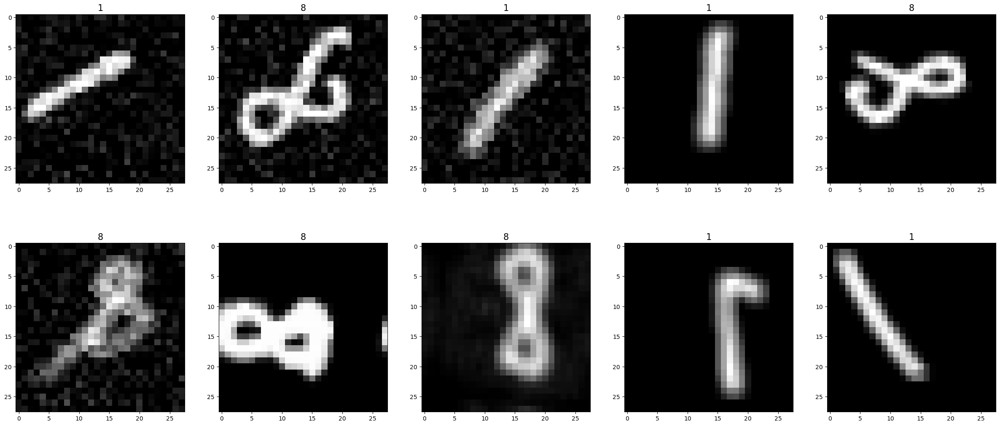

In [81]:
ii = slice(60000,60010)
show_images(X_train_infl[ii], y_train_infl[ii])

In [82]:
X_train_infl.shape

(185930, 28, 28)

In [83]:
px.histogram(y_train_infl)

## 14. Repeat steps 11-12 for these new datasets

### a. Decimated data

In [84]:
model_decim, log = apply_nn(X_train_decim, y_train_decim, x_test, y_test, epochs=epochs)

training model with 30 epochs, please wait...
done


313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 363us/step


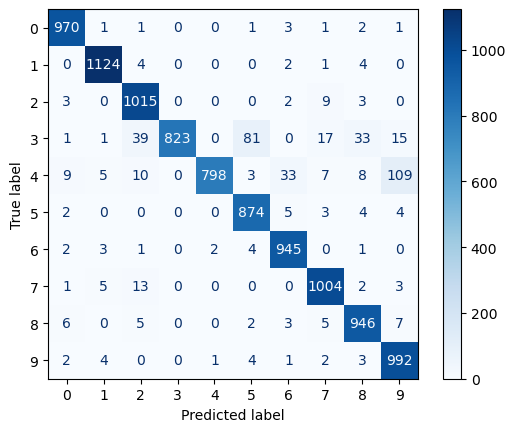

              precision    recall  f1-score   support

           0       0.97      0.99      0.98       980
           1       0.98      0.99      0.99      1135
           2       0.93      0.98      0.96      1032
           3       1.00      0.81      0.90      1010
           4       1.00      0.81      0.90       982
           5       0.90      0.98      0.94       892
           6       0.95      0.99      0.97       958
           7       0.96      0.98      0.97      1028
           8       0.94      0.97      0.96       974
           9       0.88      0.98      0.93      1009

    accuracy                           0.95     10000
   macro avg       0.95      0.95      0.95     10000
weighted avg       0.95      0.95      0.95     10000



In [85]:
rep = confuse(model_decim, x_test, y_test, "decimated")

print(rep)

`Precision` shows how often an ML model is correct when predicting the target class.    

We observe an increase in precision for the decimated classes and decrase in other classes.
In other words, since the model was trained on much less examples of decimated data, it will predict them much less, but on the ones predicted, it will be correct much more.  
On the other hand, all the true examples not predicted as decimated classes will have to be classified as something else, thus decreasing the precision on otherclasses. 

`Recall` shows whether an ML model can find all objects of the target class. 

At the same time, the recall behaves the other way around. Only the decimated classes have a major decrease, while the other classes recall does not change much 

In [86]:
f,m = report(log, "decimated")

In [87]:
f

On above graph we can observe a major decrease in overall accuracy caused by decimation 

### b. Inflated data

In [88]:
model_infl, log = apply_nn(X_train_infl, y_train_infl, x_test, y_test, epochs=epochs)

training model with 30 epochs, please wait...
done


313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 420us/step


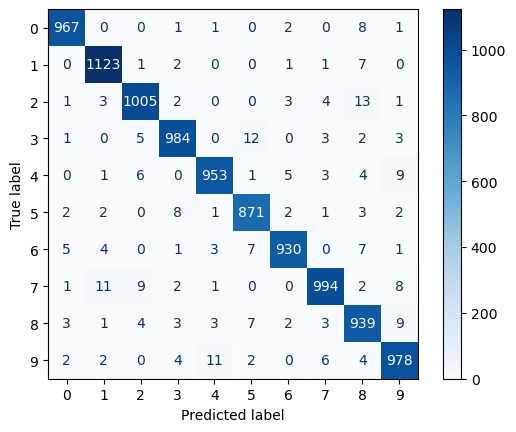

              precision    recall  f1-score   support

           0       0.98      0.99      0.99       980
           1       0.98      0.99      0.98      1135
           2       0.98      0.97      0.97      1032
           3       0.98      0.97      0.98      1010
           4       0.98      0.97      0.97       982
           5       0.97      0.98      0.97       892
           6       0.98      0.97      0.98       958
           7       0.98      0.97      0.97      1028
           8       0.95      0.96      0.96       974
           9       0.97      0.97      0.97      1009

    accuracy                           0.97     10000
   macro avg       0.97      0.97      0.97     10000
weighted avg       0.97      0.97      0.97     10000



In [89]:
rep = confuse(model_infl, x_test, y_test,"inflated")
print(rep)

On the inflated data we observe a moderate decrease of all the metrics.  
I conclude that increasing amount of data in an unbalanced way does not lead to increase in model performance. As a matter of fact, it reduces it. So data enrichment should be performed more cautiously. 

In [90]:
f,m = report(log, "inflated")

In [91]:
f

## 15. Conclusion 

In the end, blurring allowed to achieve best results on testing.
This may be a hint to the usefullness of convolution process in CNNs.

Other than that, only PCA managed to gain some improvement above original dataset.

Other procedures, that decrease (and even increase, but in a bad way) amount of information, failed to produce performance improvement. 

In [92]:
acc = drop(m, "metric", "loss")

In [93]:
fig = px.line(acc, x='epoch', y='value', color='data', 
              facet_row='metric', facet_col="set", height=600)

In [94]:
fig

In [95]:
loss = drop(m, "metric", "accuracy")

In [96]:
fig = px.line(loss, x='epoch', y='value', color='data', 
              facet_row='metric', facet_col="set", height=600)
fig

## End
